This notebook contains the code that was used to generate the figures and derive insights from the results that are published in the paper "*STOCHOS: Stochastic Opportunistic Maintenance Scheduling For Offshore Wind Farms*," to be submitted at the IISE Transactions on Operations Engineering and Analytics.

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import seaborn as sns
from time import time
import gcsfs, pickle
#import sys
#sys.path.insert(1, '../')

In [2]:
from STOCHOS import *

In [3]:
fnt = {'fontname':'Times New Roman'}
plt.rc('font',family='Times New Roman',size=14)

In [4]:
def get_true_costs(all_sols):
    """
    Retruns a list with the cost of each sample from the full solutions dictionary
    """
    costs = []
    for sample in all_sols.keys():
        costs.append(np.sum([all_sols[sample]['simulation'][i]['expected_STH_cost'] 
                   for i in range(len(all_sols[sample]['time_per_roll'])) ]) )
    
    return costs

# Import weather data and add spatial variability

In [5]:
weather_ocean_data_df = pd.read_csv("weather_ocean_data_new.csv", index_col=[0], parse_dates=True)
data = np.array(weather_ocean_data_df)
N_t=5
wind_speed_single_true = data[:,0]
wind_speed_single_NWP = data[:,2]

wave_height_true = data[:,1]
wave_height_NWP = data[:,4]

np.random.seed(24)
sv_scale = 0.5 #[m/s]
wind_speed_true = np.random.normal(loc = wind_speed_single_true.reshape(-1,1), scale = sv_scale, 
                          size = (wind_speed_single_true.shape[0],N_t))
wind_speed_NWP = np.random.normal(loc = wind_speed_single_NWP.reshape(-1,1), scale = sv_scale, 
                          size = (wind_speed_single_NWP.shape[0],N_t))

In [6]:
print('Dataset start date: ', weather_ocean_data_df.index[0])
print('Dataset end date: ', weather_ocean_data_df.index[-1])

Dataset start date:  2019-08-12 00:00:00+00:00
Dataset end date:  2020-04-29 23:00:00+00:00


# Import optimization solutions

Please download all files from the shared [Google Drive folder](https://drive.google.com/drive/folders/1kn-hTBSbv5N4VF6W8eGThGqy4OirypO5?usp=sharing) and save them in the same working directory as this notebook, then run the following cell.

In [7]:
deterministic_true_sols = pickle.load(open("RD_HOST_5WT_08.json", "rb"))
deterministic_NWP_sols = pickle.load(open("PF_HOST_5WT_08.json", "rb"))
STOCHOS = pickle.load(open("STOCHOS_5WT_50S_11.json", "rb"))
cms = pickle.load(open("CMS_5WT_11.json", "rb"))
tbs = pickle.load(open("TBS_5WT_11.json", "rb"))
dgp = pickle.load(open("DGP-HOST_5WT.json", "rb"))
naive = pickle.load(open("NAIVE-STOCHOS_5WT_50S.json", "rb"))

About optimization solutions data

In [12]:
#Solutions are stored as nested dictionaries --  first layer keys are the sample numbers
STOCHOS.keys()

dict_keys(['sample 30', 'sample 31', 'sample 32', 'sample 33', 'sample 34', 'sample 35', 'sample 36', 'sample 37', 'sample 38', 'sample 39', 'sample 40', 'sample 41', 'sample 42', 'sample 43', 'sample 44', 'sample 45', 'sample 46', 'sample 47', 'sample 48', 'sample 49', 'sample 50', 'sample 51', 'sample 52', 'sample 53', 'sample 54', 'sample 55', 'sample 56', 'sample 57', 'sample 58', 'sample 59', 'sample 60', 'sample 61', 'sample 62', 'sample 63', 'sample 64', 'sample 65', 'sample 66', 'sample 67', 'sample 68', 'sample 69', 'sample 70', 'sample 71', 'sample 72', 'sample 73', 'sample 74', 'sample 75', 'sample 76', 'sample 77', 'sample 78', 'sample 79', 'sample 80', 'sample 81', 'sample 82', 'sample 83', 'sample 84', 'sample 85', 'sample 86', 'sample 87', 'sample 88', 'sample 89', 'sample 90', 'sample 91', 'sample 92', 'sample 93', 'sample 94', 'sample 95', 'sample 96', 'sample 97', 'sample 98', 'sample 99', 'sample 100', 'sample 101', 'sample 102', 'sample 103', 'sample 104', 'sample 1

In [13]:
#Each sample is a dictionary that holds useful info
STOCHOS['sample 30'].keys()

dict_keys(['stochastic_sol', 'stochastic_input', 'simulation', 'true_input', 'time_per_roll', 'total_hourly_sched_time'])

In [14]:
#The key 'stochastic_sol' holds a list of different length, depending on the number of iterations until
#all WTs have a completed maintenance task. Each list element is a dict with useful info. 
STOCHOS['sample 30']['stochastic_sol'][0].keys()

dict_keys(['STH_sched', 'LTH_sched', 'expected_STH_cost', 'expected_LTH_cost', 'total_expected_cost', 'remaining_maint_hrs', 'model'])

In [15]:
#The key 'model' is a dict where the keys are variable names from the optimization model, and the values are
#the corresponding value after the optimization
STOCHOS['sample 30']['stochastic_sol'][0]['model']

{'p[t0,wt1,s1]': 5.2587231,
 'p[t0,wt1,s2]': 2.386613364,
 'p[t0,wt1,s3]': 1.83465168,
 'p[t0,wt1,s4]': 2.9608226039999996,
 'p[t0,wt1,s5]': 1.83465168,
 'p[t0,wt1,s6]': 1.83465168,
 'p[t0,wt1,s7]': 2.386613364,
 'p[t0,wt1,s8]': 3.802301496,
 'p[t0,wt1,s9]': 1.83465168,
 'p[t0,wt1,s10]': 2.9608226039999996,
 'p[t0,wt1,s11]': 2.9608226039999996,
 'p[t0,wt1,s12]': 1.83465168,
 'p[t0,wt1,s13]': 2.9608226039999996,
 'p[t0,wt1,s14]': 3.802301496,
 'p[t0,wt1,s15]': 2.9608226039999996,
 'p[t0,wt1,s16]': 3.802301496,
 'p[t0,wt1,s17]': 1.453159428,
 'p[t0,wt1,s18]': 2.386613364,
 'p[t0,wt1,s19]': 2.386613364,
 'p[t0,wt1,s20]': 2.9608226039999996,
 'p[t0,wt1,s21]': 2.386613364,
 'p[t0,wt1,s22]': 3.802301496,
 'p[t0,wt1,s23]': 1.83465168,
 'p[t0,wt1,s24]': 1.453159428,
 'p[t0,wt1,s25]': 4.422970092,
 'p[t0,wt1,s26]': 1.83465168,
 'p[t0,wt1,s27]': 2.386613364,
 'p[t0,wt1,s28]': 3.802301496,
 'p[t0,wt1,s29]': 2.9608226039999996,
 'p[t0,wt1,s30]': 1.453159428,
 'p[t0,wt1,s31]': 2.386613364,
 'p[t0,w

In [17]:
#Function 'get_var_from_model' that is built-in with STOCHOS allows to get the result of a variable as a numpy array:
var, var_name = get_var_from_model(STOCHOS['sample 30']['stochastic_sol'][0]['model'], 'p') #returns the power profile of the STH
var.shape

(24, 5, 50)

In [19]:
var_name[:5,0,:4]

array([['p[t0,wt1,s1]', 'p[t0,wt1,s2]', 'p[t0,wt1,s3]', 'p[t0,wt1,s4]'],
       ['p[t1,wt1,s1]', 'p[t1,wt1,s2]', 'p[t1,wt1,s3]', 'p[t1,wt1,s4]'],
       ['p[t2,wt1,s1]', 'p[t2,wt1,s2]', 'p[t2,wt1,s3]', 'p[t2,wt1,s4]'],
       ['p[t3,wt1,s1]', 'p[t3,wt1,s2]', 'p[t3,wt1,s3]', 'p[t3,wt1,s4]'],
       ['p[t4,wt1,s1]', 'p[t4,wt1,s2]', 'p[t4,wt1,s3]', 'p[t4,wt1,s4]']],
      dtype='<U14')

# Benchmark cost analysis

In [26]:
#PK-HOST: Deterministic scheduler assuming perfect knowledge of information (uses true data as input)
#STOCHOS: Stochastic opportunistic scheduler -- scenario based
#PF-HOST: Deterministic scheduler assuming total confidence in deterministic forecasts (uses raw forecasts input)
full_sol_list = [deterministic_true_sols.copy(), STOCHOS.copy(), deterministic_NWP_sols.copy()]
bench_names = 'PK-HOST STOCHOS PF-HOST'.split()

In [27]:
#PK-HOST: Deterministic scheduler with calibrated point forecasts (uses the predictive means of the probabilistic models as input)
full_sol_list.append(dgp)
bench_names.append('CPF-HOST')

In [28]:
#MD-STOCHOS: Stochastic opportunistic scheduler with Marginal Densities 
full_sol_list.append(naive)
bench_names.append('MD-STOCHOS')

In [29]:
#TBS: Time based scheduler (calendar-based)
full_sol_list.append(tbs)
bench_names.append('TBS')

In [30]:
#CMS: Corrective maintenance strategy (reactive)
full_sol_list.append(cms)
bench_names.append('CMS')

In [31]:
bench_names

['PK-HOST', 'STOCHOS', 'PF-HOST', 'CPF-HOST', 'MD-STOCHOS', 'TBS', 'CMS']

In [32]:
det_true_costs = get_true_costs(deterministic_true_sols)
det_forecast_costs = get_true_costs(deterministic_NWP_sols)
stochos_costs = get_true_costs(STOCHOS)
costs_arr = np.array([det_true_costs, stochos_costs, det_forecast_costs]).T

In [33]:
dgp_costs = get_true_costs(dgp)
costs_arr = np.append(costs_arr, np.array(dgp_costs).reshape(-1,1),1)

In [34]:
naive_costs = get_true_costs(naive)
costs_arr = np.append(costs_arr, np.array(naive_costs).reshape(-1,1),1)

In [35]:
tbs_costs = get_true_costs(tbs)
costs_arr = np.append(costs_arr, np.array(tbs_costs).reshape(-1,1),1)

In [36]:
cms_costs = get_true_costs(cms)
costs_arr = np.append(costs_arr, np.array(cms_costs).reshape(-1,1),1)

In [37]:
all_costs = pd.DataFrame(costs_arr, index = np.array(list(STOCHOS.keys())), 
                         columns = bench_names[:costs_arr.shape[-1]])

In [38]:
all_costs.describe()

,PK-HOST,STOCHOS,PF-HOST,CPF-HOST,MD-STOCHOS,TBS,CMS
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,38924.134507,43429.738137,44967.734791,44940.269023,49927.341452,106103.709934,127909.746134
std,8285.325967,11685.530986,11942.772796,11954.645152,15847.742339,29287.066942,27540.243266
min,32563.894309,32568.665019,32613.270984,32613.270984,32579.290932,61973.140102,78320.333237
25%,34432.278916,35389.623094,35714.995370,35577.894161,38582.713845,86555.214582,107028.396843
50%,35854.598121,39690.118938,42359.379433,42181.198992,44568.775772,100200.061731,127162.416435
75%,39935.559204,47667.851880,51618.254593,52016.144963,53598.133780,127636.970649,144900.127699
max,87145.283608,103945.098911,104902.759177,104902.759177,110215.167047,196930.350667,198549.662293


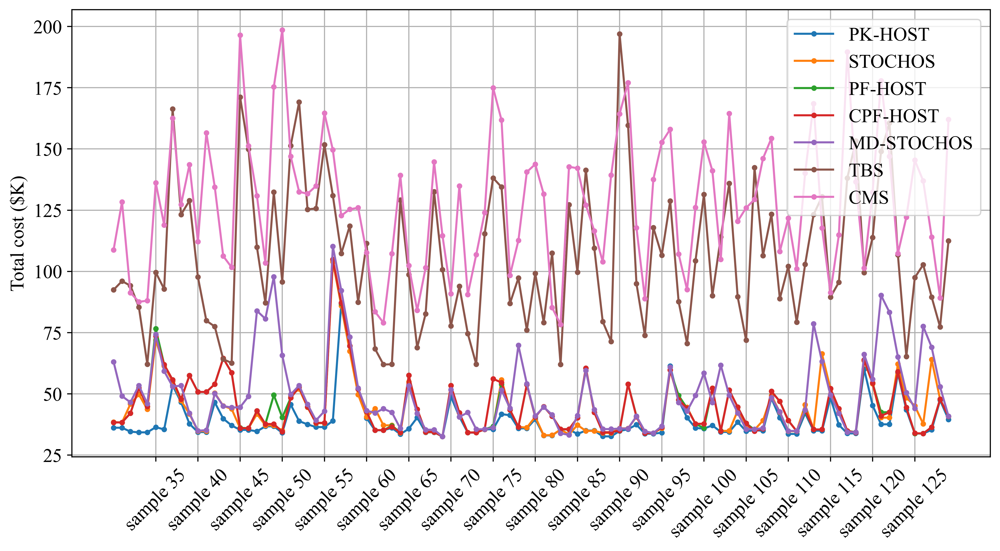

In [39]:
plt.figure(figsize=(12,6), dpi=500)
plt.plot(all_costs/1000, '-o', markersize=3)
plt.ylabel('Total cost ($K)')
plt.grid(True)
plt.xticks([i for i in range(5,len(all_costs),5)], 
           all_costs.index[5::5], rotation=45)
plt.legend(all_costs.columns[:costs_arr.shape[-1]])

In [41]:
x = all_costs.drop(columns=['CPF-HOST','MD-STOCHOS'])

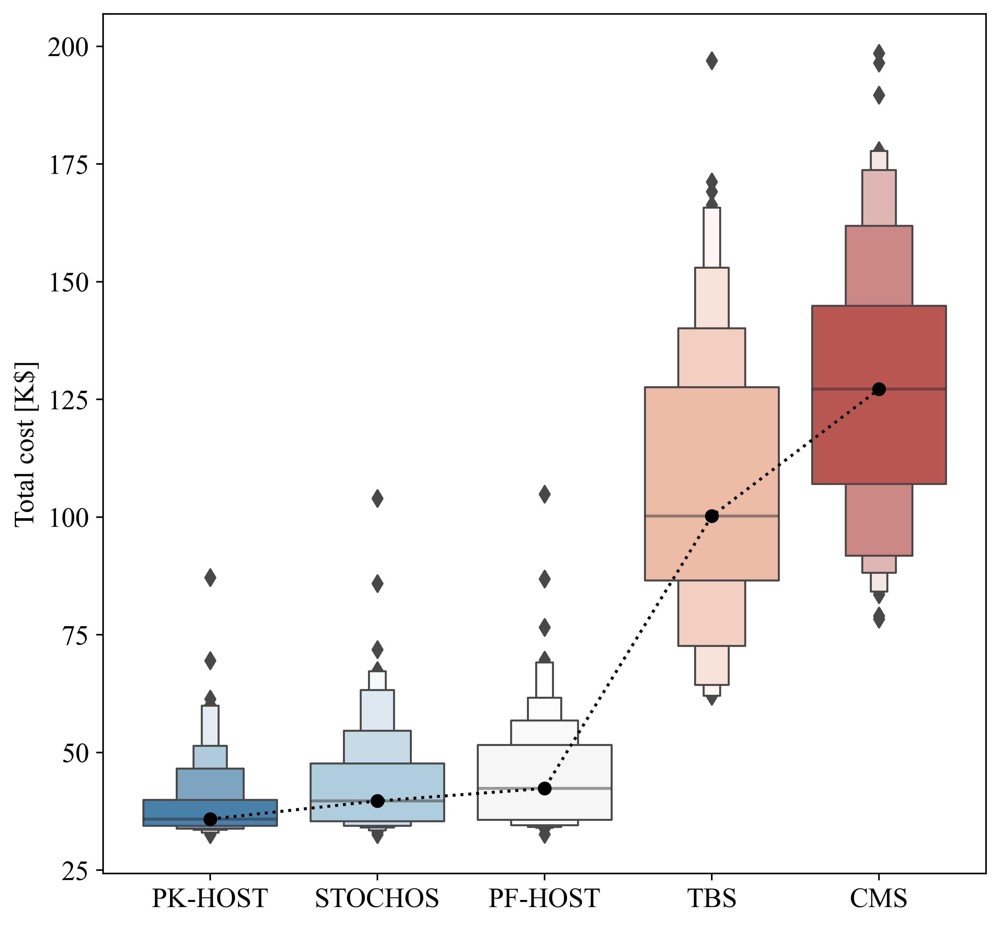

In [42]:
plt.figure(figsize=(8,8), dpi=500)
sns.boxenplot(data=x/1000, showfliers=True, k_depth = 'trustworthy', palette='RdBu_r')
#sns.swarmplot(data=all_costs/1000, color='k', size=2)

plt.ylabel('Total cost [K$]')
_ = plt.xticks(range(0,x.shape[1]+0),x.columns)
plt.plot(np.arange(0,x.shape[1]+0),np.median(x,0)/1000,'o:',color='k')
#colors = ['pink', 'lightblue', 'lightgreen', 'red', 'blue']
#for patch, color in zip(bplot['boxes'], colors):
#    patch.set_facecolor(color)

# Schedule visualization

In [43]:
turbine=1
sample_num = 40
N_S=50
rolls = 7 



sample = 'sample '+str(sample_num)

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)


access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

In [44]:
#Accessibility accuracy per day: weather scenarios
(access==np.repeat((access33.T)[:,:,np.newaxis],access.shape[-1],-1)).mean(-1).mean(1)

array([0.81      , 1.        , 0.70833333, 0.6725    , 0.6575    ,
       0.92666667, 0.99666667])

In [45]:
#Accessibility accuracy per day: point forecasts
(access22==access33).mean(0)

array([0.79166667, 1.        , 0.83333333, 0.625     , 0.66666667,
       1.        , 1.        ])

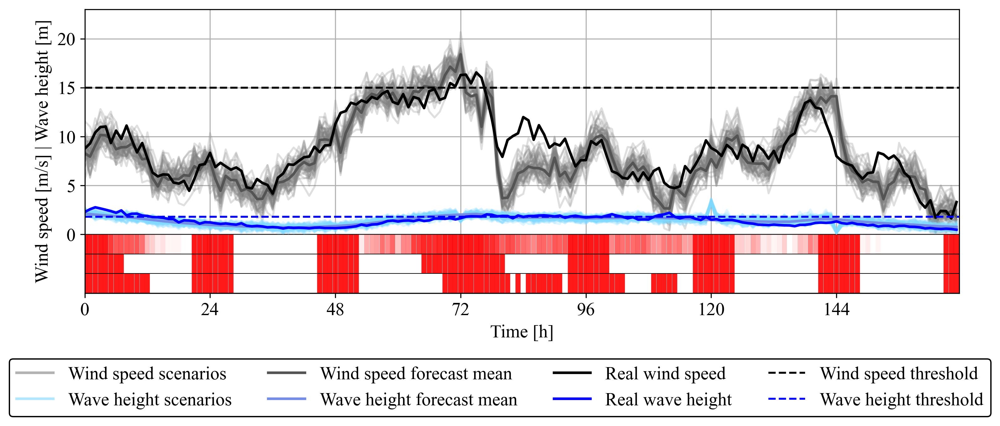

In [46]:
plt.figure(figsize=(12,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.5, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['Wind speed scenarios','Wave height scenarios','Wind speed forecast mean','Wave height forecast mean',
           'Real wind speed', 'Real wave height', 'Wind speed threshold', 'Wave height threshold'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)
plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.5, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
plt.ylabel('Wind speed [m/s] | Wave height [m]')
plt.ylim([-6,23])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])


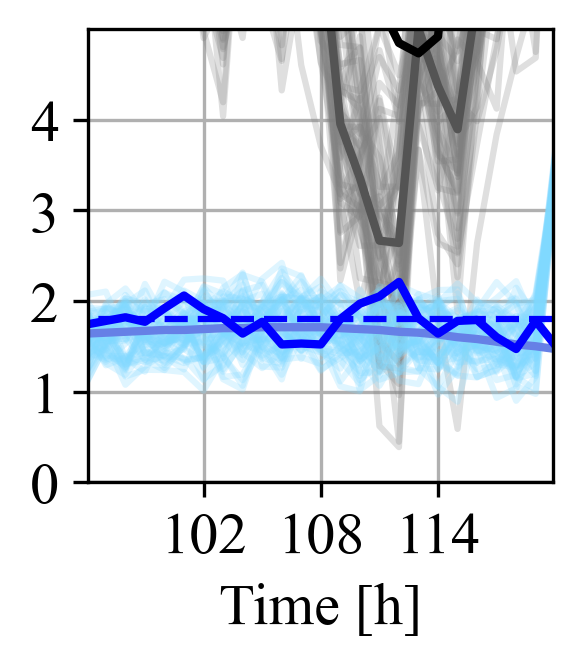

In [47]:
#draw inset for day 5
plt.figure(figsize=(2,2), dpi=300)


plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.5, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.40, 0.50, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24/4), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
#plt.ylabel('Wind speed [m/s] | Wave height [m]')

plt.yticks([0,1,2,3,4,10,15,20])
plt.ylim([0,5])
_=plt.xlim([96.1,119.9])



In [48]:
def show_full_schedule_simple(ax, solutions, sample, names, lw=19, return_schedule = False):
    """
    Generates a Gantt-chart for the STH schedule from all runs.
    
    Input:
    -ax: the pyplot axis on which to draw
    -solutions: a list with all the benchmark solutions
    -sample: str with the key of the sample solution to draw
    -names: list of str with the name of each benchmark in solutions
    -lw: linewidth for maintenance interruptions
    -return_schedule: bool; if True, it also returns the full hourly schedule as a numpy array.
    """   
    
    #create legend
    names.append('Maintenance interruption')
    hatches = ['....','////','OO','XXX','\\\\\\','++','oo']
    for method in range(len(solutions)):
        boxes = Rectangle((-1,1), 1, 1, fill=False, hatch=hatches[method], zorder=10)
        ax.add_patch(boxes)
    ax.hlines(-1, 1, 1, color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=1)
    
    ax.legend(names, ncol=[int((len(names)+1)/2) if len(names)+1>4 else len(names)][0],
              loc='upper center', bbox_to_anchor=(0,0,0.95,-0.28), framealpha=1, edgecolor='k')
    names=names[:-1]
    
    #create the schedule Gantt chart for each method
    for method in range(len(solutions)):
        solution = solutions[method][sample]
        schedule = np.array(solution['simulation'][0]['STH_sched'])
        op_time = solution['true_input'][0][4]
        
        #first create the full hourly schedule as a numpy array
        for i in range(1,len(solution['time_per_roll'])):
            schedule = np.append(schedule,np.array(solution['simulation'][i]['STH_sched']), 0)
            op_time = np.append(op_time, solution['true_input'][i][4],0)

        #get the full true hourly accessibility as a numpy array
        sol = solutions[method][sample]
        accessibility = sol['true_input'][0][6]

        for roll in range(1,len(solution['time_per_roll'])):
            accessibility = np.concatenate((accessibility, sol['true_input'][roll][6]),0)

        accessibility=accessibility[:,:,0]
        
        N_t = accessibility.shape[1]

        x = np.arange(schedule.shape[0])
        
        for i in range(N_t):
            
            y=i+method/len(solutions)+(1/len(solutions)-0.05)/2 #center of the rectangles
            
            z = np.where(schedule[:,i]==1)[0]
            if np.sum(schedule[:,i])>1: #maintenance interruptions
                for j in range(int(np.sum(schedule[:,i]))-1):
                    plt.hlines(np.full(op_time[z[j],i,0], y),
                               x[z[j]:z[j]+op_time[z[j],i,0]]*(1-accessibility[z[j]:z[j]+op_time[z[j],i,0],i]),
                               (x[z[j]:z[j]+op_time[z[j],i,0]]+1.2)*(1-accessibility[z[j]:z[j]+op_time[z[j],i,0],i]),
                               color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=0)

                    plt.hlines(np.full(schedule.shape[0], y),
                               (z[j]+op_time[z[j],i,0]), z[j+1], color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=1)
                    
            x_time = np.where(schedule[:,i]==1)[0]
            #calculate the maintenance duration and cunstruct the rectangles
            if x_time.shape[0]>1:
                maint_len = x[x_time[-1]]-x[x_time[0]]+op_time[x_time[-1],i,0]
            else:
                maint_len = op_time[x_time,i,0]
            boxes = Rectangle((x_time[0],i+method/len(solutions)), maint_len, 1/len(solutions)-0.05,
                           fill=False, hatch=hatches[method], zorder=10)
            ax.add_patch(boxes)
        
 
    if return_schedule: return schedule

C:\Users\user\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


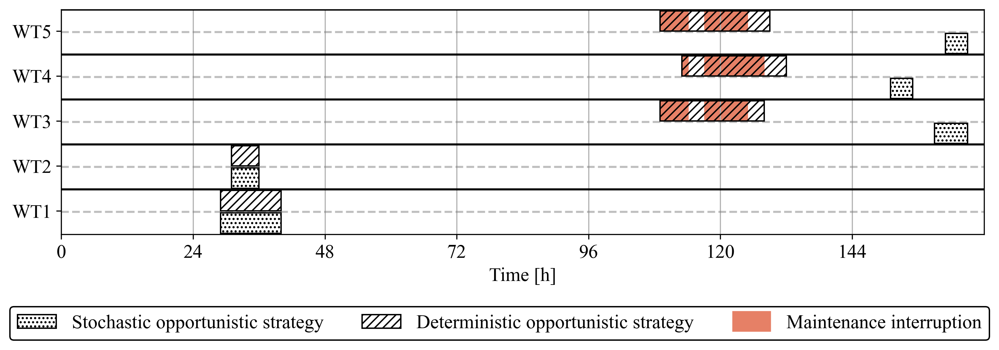

In [49]:
bench_idx = [1,2] #index of benchmarks used from full_sol_list. In this case STOCHOS (1) and PF-HOST (2)
N_t=5
names=['Stochastic opportunistic strategy', 'Deterministic opportunistic strategy']

fig, ax = plt.subplots(1, 1, figsize=(12,3), dpi=300)

show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          names=names, lw=15)

plt.yticks([i+0.5 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('Time [h]')
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

In [515]:
#another example with more benchmarks
turbine=1
sample_num = 103
N_S=50
rolls = 24

In [516]:
sample = 'sample '+str(sample_num)

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1

accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)


access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

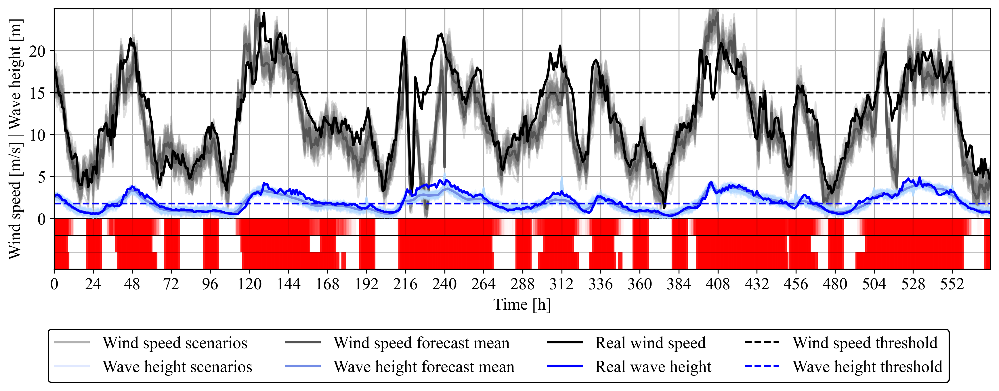

In [517]:
plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['Wind speed scenarios','Wave height scenarios','Wind speed forecast mean','Wave height forecast mean',
           'Real wind speed', 'Real wave height', 'Wind speed threshold', 'Wave height threshold'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')


plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25) #scenario accessibility
plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
plt.ylabel('Wind speed [m/s] | Wave height [m]')
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



In [388]:
bench_names

['PK-HOST', 'STOCHOS', 'PF-HOST', 'DGP-HOST', 'NAIVE-STOCHOS', 'TBS', 'CMS']

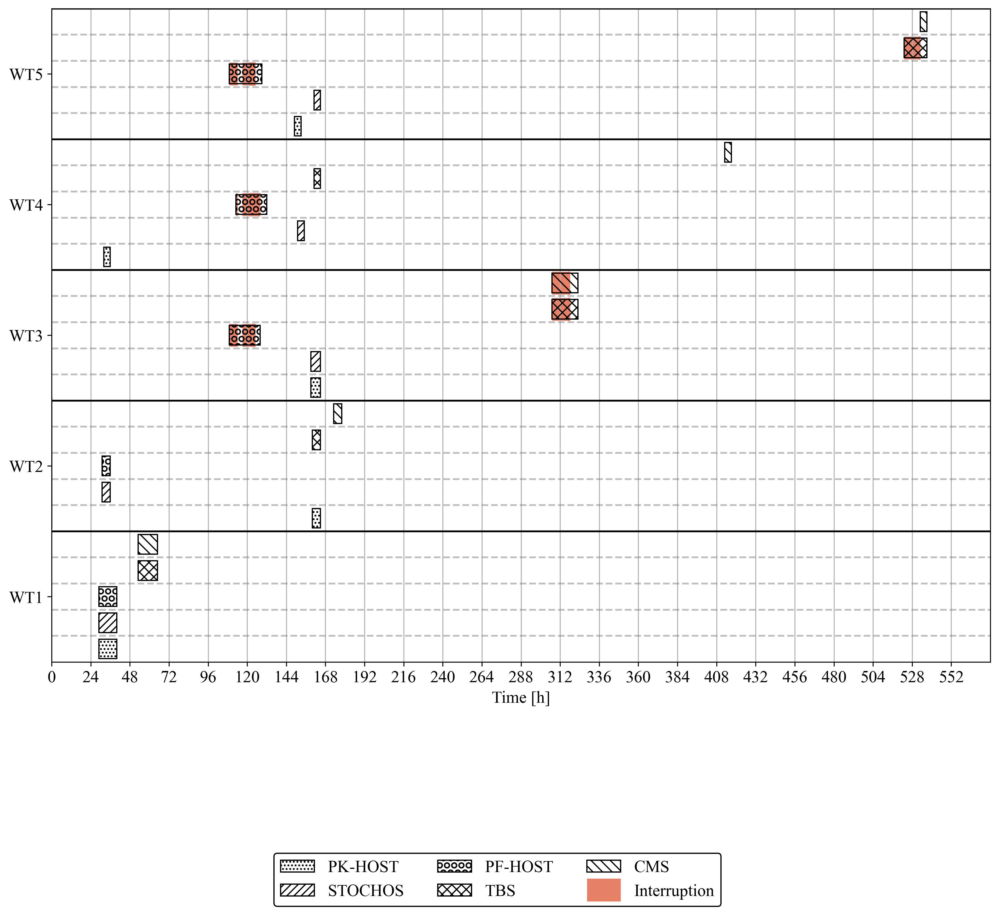

In [394]:
bench_idx = [0,1,2,-2,-1]
N_t=5

#bench_bool = list(np.isin(np.arange(len(bench_names)),bench_idx))

fig, ax = plt.subplots(1, 1, figsize=(14,10), dpi=300)

#plt.plot(-10,1, 'ks', markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, 's', color=[0.9,0.5,0.4] , markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, color='orange', linewidth=3,alpha=1) #Residual life (actual)
#plt.plot(-10,1, color='red', linewidth=2, alpha=1 if i==1 else 0.4) #Residual life (estimate)
show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          [bench_names[i] for i in bench_idx], lw=19)

#plt.title(bench_names[i])
plt.yticks([i+0.5-0.025 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('Time [h]')
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

In [396]:
turbine=1
sample_num = 49
method_num=1
N_S=50
rolls = 24

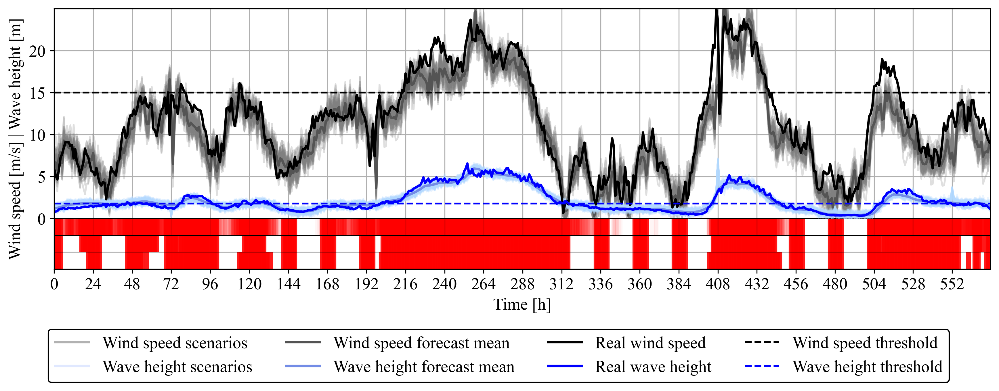

In [397]:
 #Original scenario gen

sample = 'sample '+str(sample_num)

'''ws_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][7][:,turbine,:]
wh_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][8]
for roll in range(1,rolls):
    ws_scenarios = np.concatenate((ws_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][7][:,turbine,:]),0)
    wh_scenarios = np.concatenate((wh_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][8]),0)
'''

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['Wind speed scenarios','Wave height scenarios','Wind speed forecast mean','Wave height forecast mean',
           'Real wind speed', 'Real wave height', 'Wind speed threshold', 'Wave height threshold'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')





accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)

access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
plt.ylabel('Wind speed [m/s] | Wave height [m]')
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



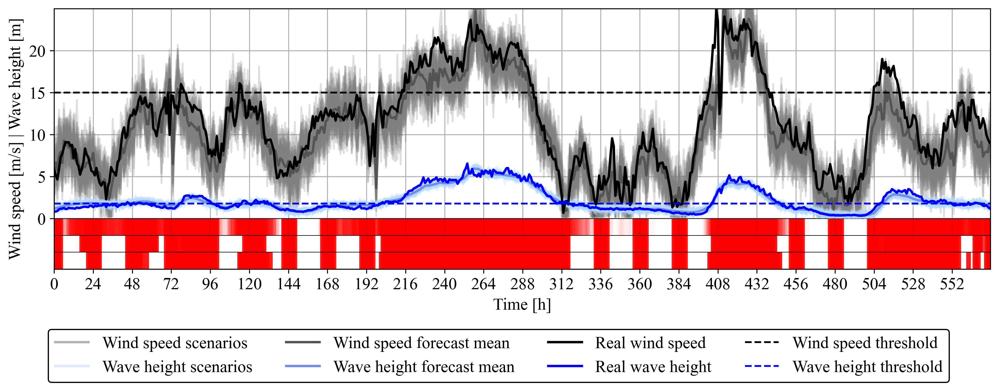

In [399]:
 #NAIVE STOCHOS scenarios

sample = 'sample '+str(sample_num)

'''ws_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][7][:,turbine,:]
wh_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][8]
for roll in range(1,rolls):
    ws_scenarios = np.concatenate((ws_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][7][:,turbine,:]),0)
    wh_scenarios = np.concatenate((wh_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][8]),0)
'''

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),ws_error_hist.std()),size=(24,N_S))
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),wh_error_hist.std()),size=(24,N_S))
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['Wind speed scenarios','Wave height scenarios','Wind speed forecast mean','Wave height forecast mean',
           'Real wind speed', 'Real wave height', 'Wind speed threshold', 'Wave height threshold'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')





accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)

access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
plt.ylabel('Wind speed [m/s] | Wave height [m]')
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



C:\Users\user\Anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


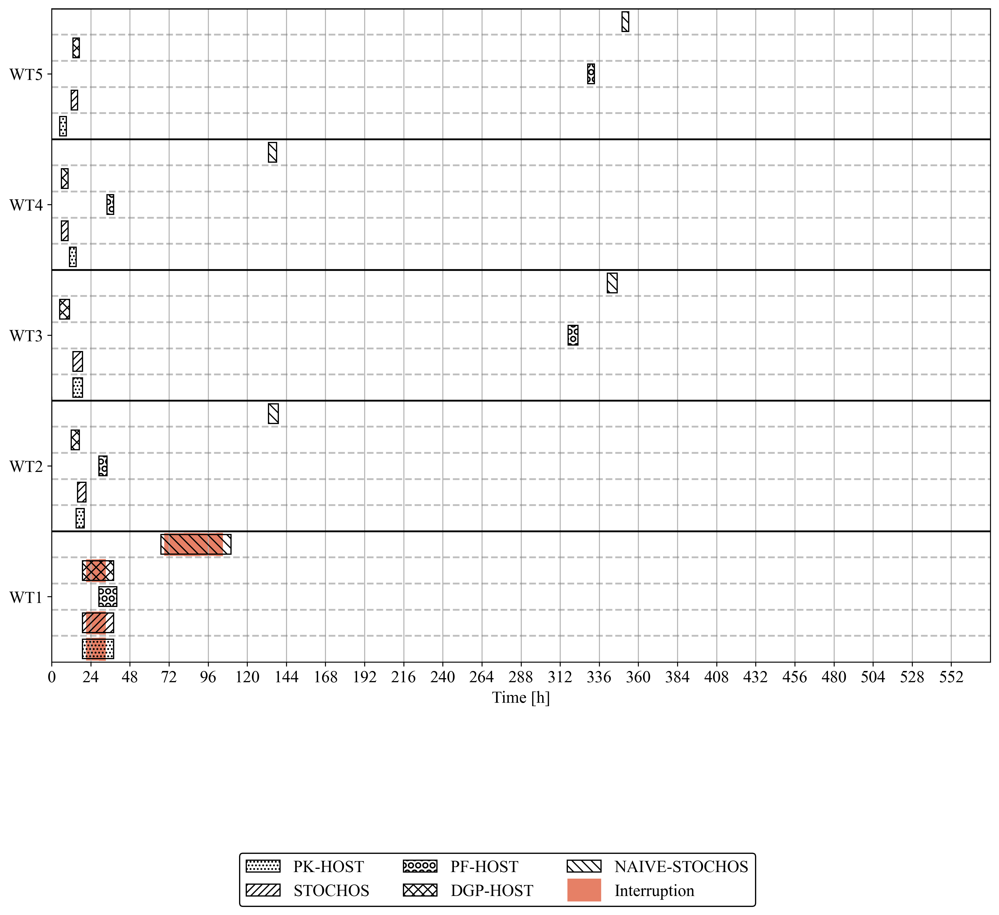

In [398]:
bench_idx = [0,1,2,3,4]
N_t=5

#bench_bool = list(np.isin(np.arange(len(bench_names)),bench_idx))

fig, ax = plt.subplots(1, 1, figsize=(14,10), dpi=300)

#plt.plot(-10,1, 'ks', markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, 's', color=[0.9,0.5,0.4] , markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, color='orange', linewidth=3,alpha=1) #Residual life (actual)
#plt.plot(-10,1, color='red', linewidth=2, alpha=1 if i==1 else 0.4) #Residual life (estimate)
show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          [bench_names[i] for i in bench_idx], lw=19)

#plt.title(bench_names[i])
plt.yticks([i+0.5-0.025 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('Time [h]')
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

#plt.legend(['Scheduled maintenance', 'Maintenance interruption'], ncol=2,
#                  loc='upper center', bbox_to_anchor=(0,0,0.95,-0.28), framealpha=1, edgecolor='k')

# Revenue profile visualization

In [50]:
prices_forecasts = pd.read_csv('True_n_LEAR_el_prices_da_comed.csv', index_col=[0])

In [51]:
wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]

el_price_forecast = np.array(prices_forecasts['LEAR 56'])[sample_num*24:(sample_num+rolls)*24]
el_price_real = np.array(prices_forecasts['Real price'])[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wind_scenarios_naive = np.zeros((24*rolls,N_S))

price_scenarios = np.zeros((24*rolls,N_S))
price_scenarios_naive = np.zeros((24*rolls,N_S))

for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    ep_error_hist= np.array(prices_forecasts['LEAR 56'])[:(sample_num+i)*24]-np.array(
        prices_forecasts['Real price'])[:(sample_num+i)*24]
    ep_error_scen = error_scenario_gen(ep_error_hist,24,N_S,24*5)
    price_scenarios[24*i:24*(i+1),:] = np.repeat(el_price_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ep_error_scen

    ws_error_scen2 = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),ws_error_hist.std()),size=(24,N_S))
    wind_scenarios_naive[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen2
    
    ep_error_hist= np.array(prices_forecasts['LEAR 56'])[:(sample_num+i)*24]-np.array(
        prices_forecasts['Real price'])[:(sample_num+i)*24]
    ep_error_scen2 = error_scenario_gen(ep_error_hist,24,N_S,24*5)
    price_scenarios_naive[24*i:24*(i+1),:] = np.repeat(el_price_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ep_error_scen2
    
power_original = binning_method(wind_scenarios)*12
power_naive = binning_method(wind_scenarios_naive)*12
power_pf = binning_method(wind_speed_forecast)*12
power_true = binning_method(wind_speed_real)*12

revenue_original = power_original*price_scenarios
revenue_naive = power_naive*price_scenarios_naive
revenue_pf = power_pf*el_price_forecast
revenue_real = power_true*el_price_real

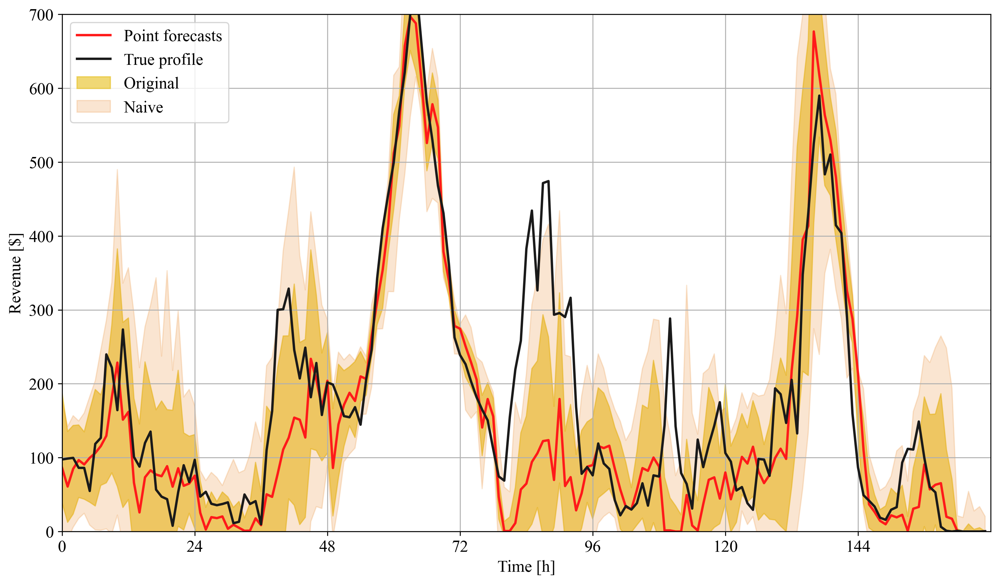

In [52]:
plt.figure(figsize=(14,8), dpi=300)

plt.fill_between(np.arange(revenue_original.shape[0]),
                 revenue_original.mean(1)+2*revenue_original.std(1),
                 revenue_original.mean(1)-2*revenue_original.std(1),color=[0.9,0.75,0.1], alpha = 0.6)
plt.fill_between(np.arange(revenue_naive.shape[0]),
                 revenue_naive.mean(1)+2*revenue_naive.std(1),
                 revenue_naive.mean(1)-2*revenue_naive.std(1),color=[0.9,0.5,0.1], alpha = 0.2)
plt.plot(revenue_pf,color=[1,0.1,0.1], alpha = 1, linewidth=2)
plt.plot(revenue_real,color=[0.1,0.1,0.1], alpha = 1, linewidth=2)
plt.xlim([0,revenue_original.shape[0]])
plt.ylim([0,700])
plt.legend(['Point forecasts','True profile','Original','Naive'])
plt.xlabel('Time [h]')
_=plt.ylabel('Revenue [$]')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)

# Operational data and forecasts visualizations

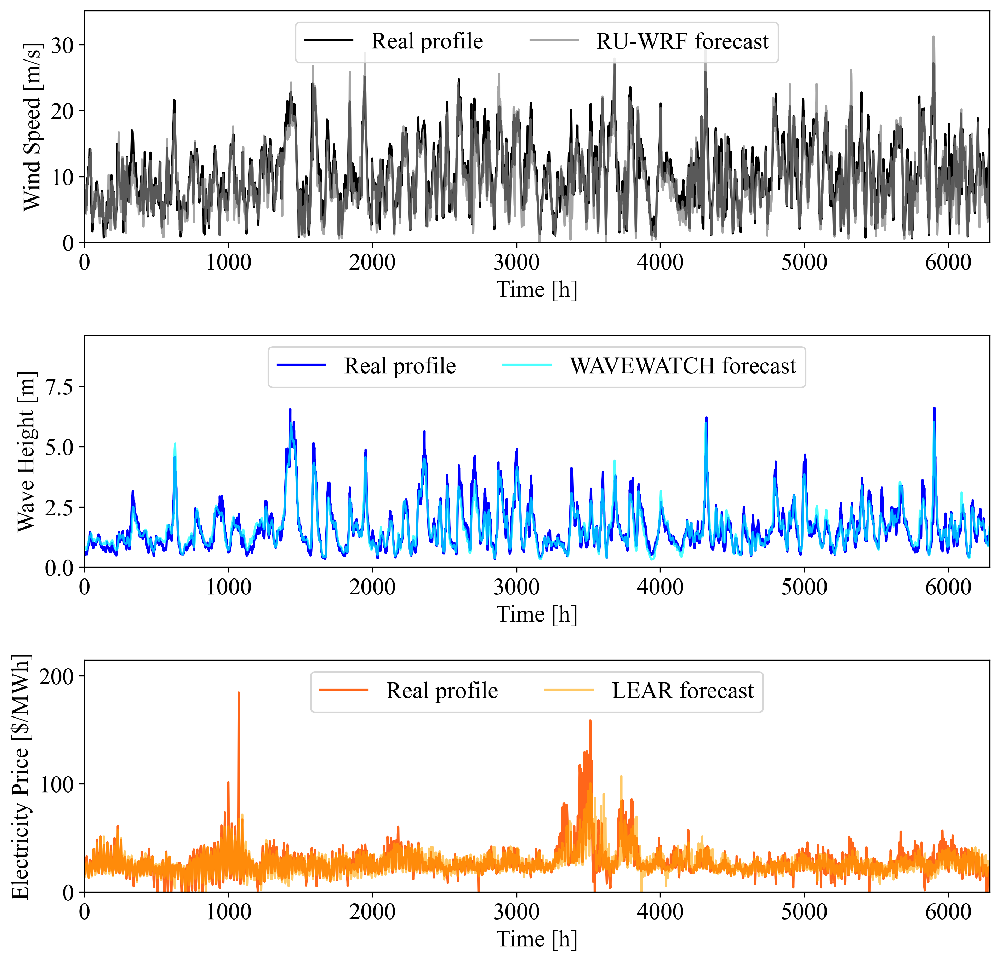

In [53]:
fnt = {'fontname':'Times New Roman'}
plt.rc('font',family='Times New Roman',size=16)


fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(11,11), dpi=300)
#plt.tight_layout()

ax1.plot(np.array(saved_data['NYE05.wind_speed_100m']), color='black')
ax1.plot(np.array(saved_data['RUWRF.wind_speed_100m']), color='grey', alpha=0.7)
ax1.set_ylabel('Wind Speed [m/s]')
ax1.set_xlabel('Time [h]')
ax1.set_ylim([0,saved_data['NYE05.wind_speed_100m'].max()+8])
ax1.set_xlim([0,saved_data.shape[0]])
ax1.legend(['Real profile', 'RU-WRF forecast'], ncol=2, loc='upper center')
plt.subplots_adjust(hspace = 0.4)

ax2.plot(np.array(saved_data['NYE05.wave_height']), color='blue')
ax2.plot(np.array(saved_data['NOAA.wave_height']), color='cyan', alpha=0.7)
ax2.set_ylabel('Wave Height [m]')
ax2.set_xlabel('Time [h]')
ax2.set_ylim([0,saved_data['NYE05.wave_height'].max()+3])
ax2.set_xlim([0,saved_data.shape[0]])
ax2.legend(['Real profile', 'WAVEWATCH forecast'], ncol=2, loc='upper center')

ax3.plot(np.array(prices_forecasts['Real price']), color=[1, 0.4, 0.1])
ax3.plot(np.array(prices_forecasts['LEAR 56']), color='orange', alpha=0.6)
ax3.set_ylabel('Electricity Price [$/MWh]')
ax3.set_xlabel('Time [h]')
ax3.set_ylim([0,prices_forecasts['Real price'].max()+30])
ax3.set_xlim([0,saved_data.shape[0]])
ax3.legend(['Real profile', 'LEAR forecast'], ncol=2, loc='upper center')

C:\Users\user\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\user\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\user\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

Text(0.5, 1.0, 'Electricity price')

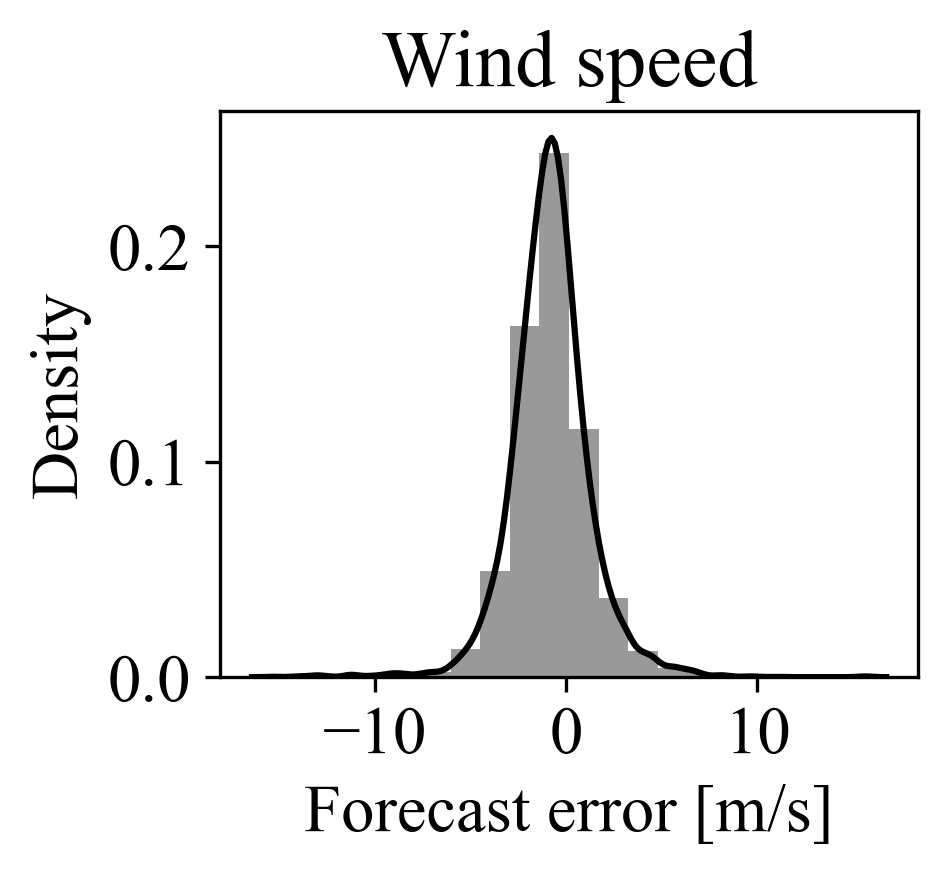

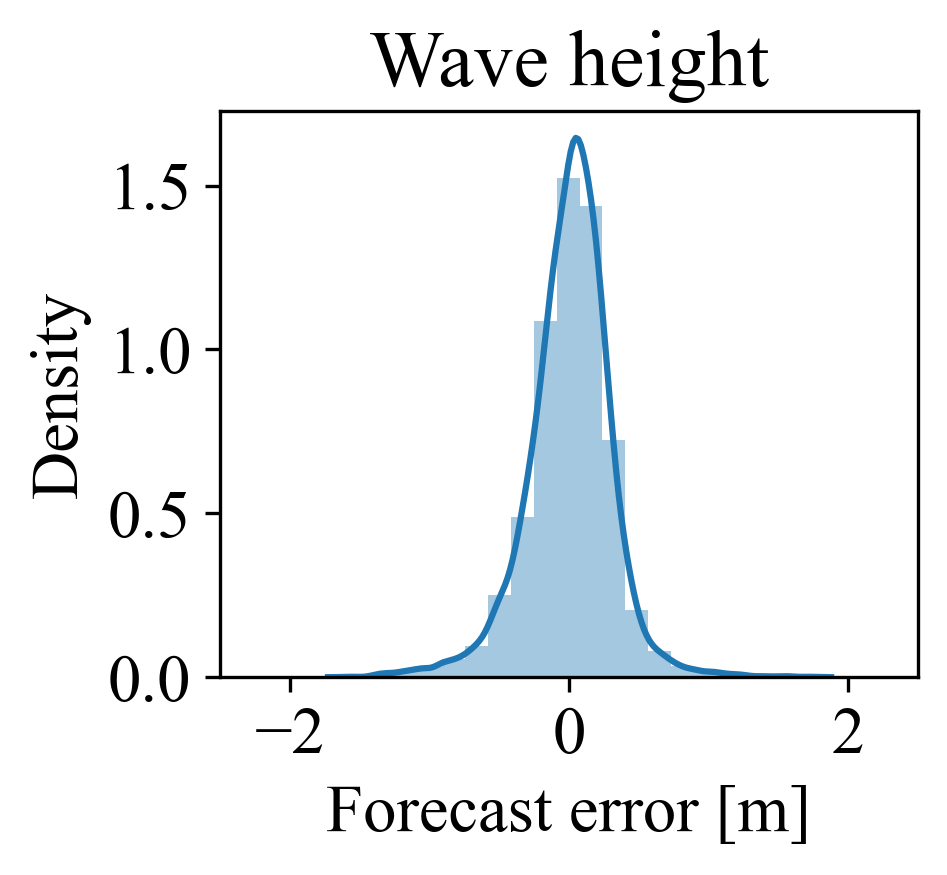

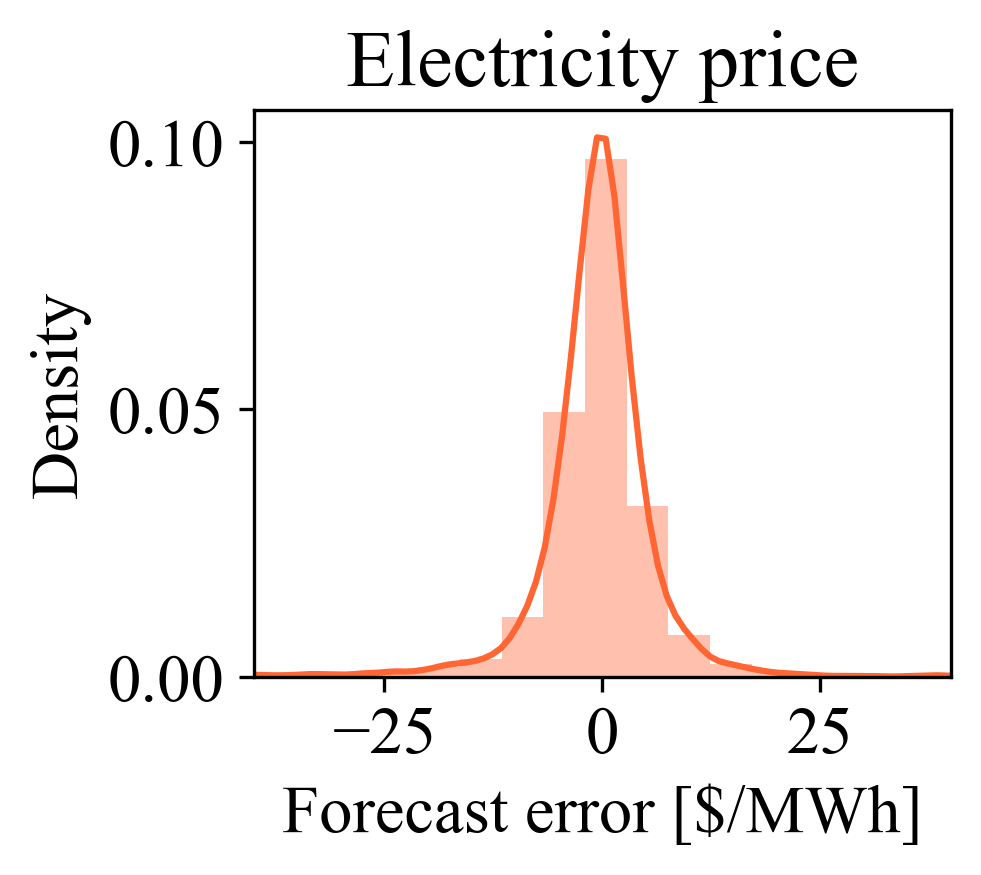

In [54]:
plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'], bins=20, color='k')
plt.xlabel('Forecast error [m/s]')
plt.title('Wind speed')

plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(weather_ocean_data_df['NOAA.wave_height']-weather_ocean_data_df['NYE05.wave_height'], bins=20)
plt.xlabel('Forecast error [m]')
plt.title('Wave height')
plt.xlim([-2.5,2.5])


plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(prices_forecasts['LEAR 56']-prices_forecasts['Real price'], bins=40, color=[1, 0.4, 0.2])
plt.xlabel('Forecast error [$/MWh]')
plt.xlim([-40,40])
plt.title('Electricity price')

In [55]:
weather_ocean_data_df.columns

Index(['NYE05.wind_speed_100m', 'NYE05.wave_height', 'RUWRF.wind_speed_100m',
       'RUWRF.wind_dir_100m', 'NOAA.wave_height', 'NOAA.wave_dir',
       'NOAA.wind_speed_10m', 'NOAA.wind_dir_10m'],
      dtype='object')

In [56]:
lags = 5
by = 1
start = 0
end = 300 + lags*by
cols = []
real_ws_arr = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'])[start:end]
real_wh_arr = np.array(weather_ocean_data_df['NOAA.wave_height']-weather_ocean_data_df['NYE05.wave_height'])[start:end]
real_ep_arr = np.array(prices_forecasts['LEAR 56']-prices_forecasts['Real price'])[start:end]

lagged_data1 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))
lagged_data2 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))
lagged_data3 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))

for i, lag in enumerate(np.arange(0, lags*by, by)):
    lagged_data1[:,i] = real_ws_arr[lag:-lags*by+lag]
    lagged_data2[:,i] = real_wh_arr[lag:-lags*by+lag]
    lagged_data3[:,i] = real_ep_arr[lag:-lags*by+lag]
    cols.append('lag='+str(lag)) 

lagged_data1_df = pd.DataFrame(lagged_data1, columns = cols)
lagged_data2_df = pd.DataFrame(lagged_data2, columns = cols)
lagged_data3_df = pd.DataFrame(lagged_data3, columns = cols)

In [57]:
def showLagKde(lagged_data, title='Wind speed residuals', c1='k', c2=[0.3,0.3,0.3], figsize=(10,3)):
    
    fig = plt.figure(figsize=figsize,dpi=200)
    lags=len(lagged_data.columns)
    gs = fig.add_gridspec(1, lags-1, hspace=0, wspace=0)
    axs = gs.subplots(sharey='col')
    
    for i,col in enumerate(lagged_data.columns[1:]):
        axs[i].plot(lagged_data[col],lagged_data['lag=0'],'.', markersize=3, color=c1,zorder=0)
        sns.kdeplot(ax=axs[i], data=lagged_data, x=col, y='lag=0', color=c2, alpha=0.9,levels=4, thresh=0.2,zorder=i+1)
    
    fig.suptitle(title)
    
    for ax in axs.flat:
        ax.label_outer()
        
    return axs

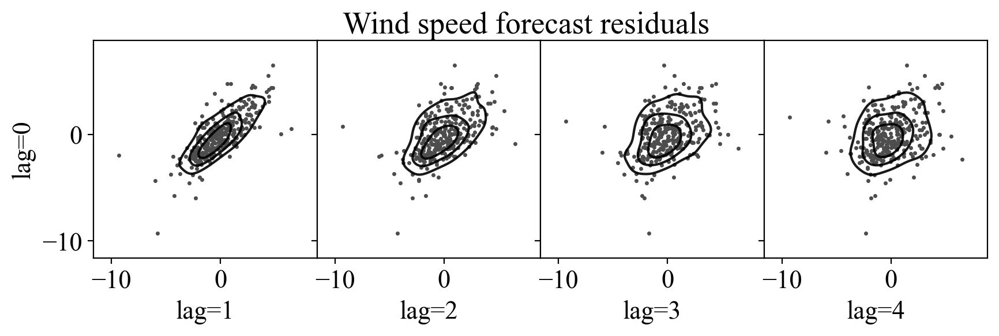

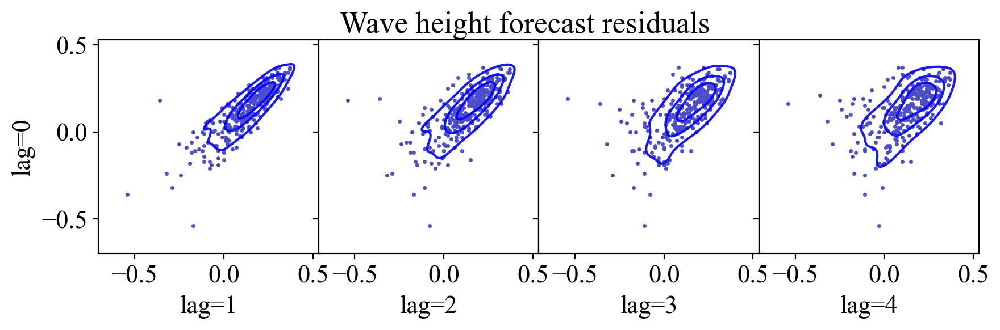

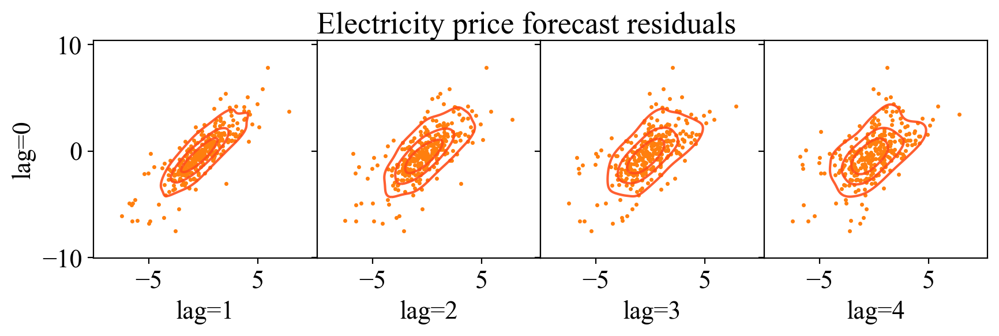

In [58]:
_=showLagKde(lagged_data1_df, title='Wind speed forecast residuals', c1=[0.3,0.3,0.3], c2='k', figsize=(10,2.5))
_=showLagKde(lagged_data2_df, title='Wave height forecast residuals', c1=[0.3,0.3,0.8], c2='b', figsize=(10,2.5))
ax=showLagKde(lagged_data3_df, title='Electricity price forecast residuals', c1='tab:orange', c2=[1,0.3,0.1], figsize=(10,2.5))
for i in range(4):
    ax[i].set_xticks([-5,5])

# Scenario generation process figures

In [59]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

In [60]:
ws_residuals_full = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'])

In [61]:
history = 5 #days
forward = 10 #day
train_end = 30 #days
pred_len = 24 #hours

Y_train = ws_residuals_full[(forward+train_end-history)*24:(forward+train_end)*24]
X_train = np.arange(Y_train.shape[0]).reshape(-1,1)
print(Y_train.shape, X_train.shape)

(120,) (120, 1)


In [62]:
weather_ocean_data_df.index[40*24] #the date visualized in the following figures

Timestamp('2019-09-21 00:00:00+0000', tz='UTC')

In [63]:
ws_forecast = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m'])
ws_true = np.array(weather_ocean_data_df['NYE05.wind_speed_100m'])

In [64]:
kernel = RBF()
gp = GaussianProcessRegressor(kernel=kernel, alpha = np.random.normal(0.5,1,(Y_train.shape[0]))**2,
                               random_state=0,  n_restarts_optimizer=10)

In [65]:
t1 = time()
gp.fit(X_train, Y_train)
print(time()-t1)

0.15954113006591797


In [66]:
Y_val = ws_residuals_full[(forward+train_end)*24:(forward+train_end)*24+pred_len]
X_val = (X_train[-1,0] + np.arange(pred_len)).reshape(-1,1)

In [67]:
ws_forecast_val = ws_forecast[(forward+train_end)*24:(forward+train_end)*24+pred_len].copy()
ws_true_val = ws_true[(forward+train_end)*24:(forward+train_end)*24+pred_len].copy()

In [68]:
Y_pred, sigma_pred = gp.predict(X_val, return_cov=True)

In [74]:
sigma_pred.shape

(24, 24)

Text(2.222222222222223, 0.5, 'Time [h]')

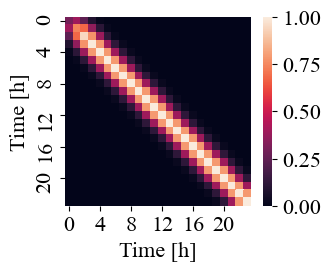

In [70]:
plt.figure(figsize=(3,2.5),dpi=100)
sns.heatmap(sigma_pred)
plt.xlabel('Time [h]')
plt.ylabel('Time [h]')

In [71]:
samples = gp.sample_y(X_val,1000) #set the number of scenarios to generate

Text(0.5, 0, 'Time [h]')

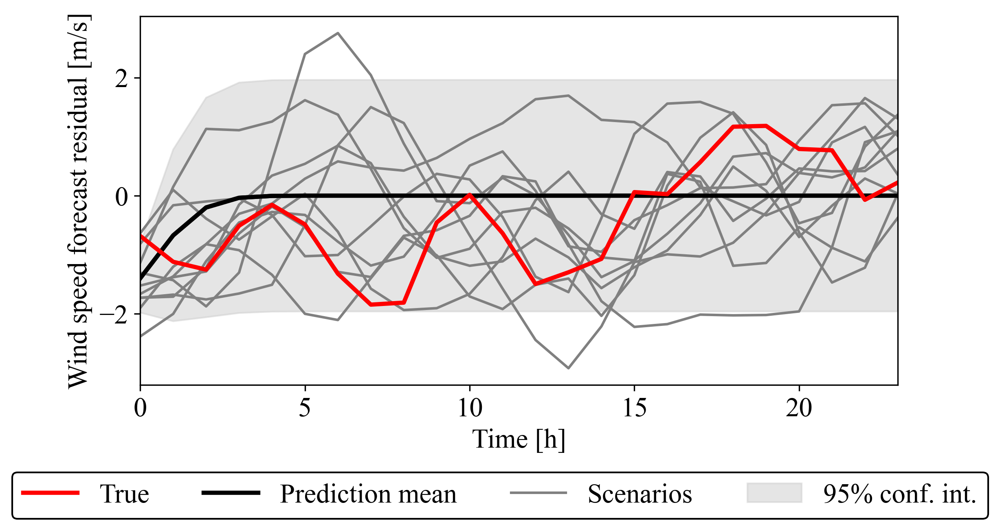

In [75]:
x = np.arange(24)
plt.figure(figsize=(8,4), dpi=300)
plt.plot([-1,-2],[0,1], color='red', linewidth=2.5)
plt.plot(x,Y_pred, color='black', linewidth=2.5)
plt.plot([-1,-2],[0,1], color='grey')
plt.fill_between([-1,-2],[0,1], alpha=0.5, color=[0.8,0.8,0.8])

plt.legend(['True', 'Prediction mean', 'Scenarios', '95% conf. int.'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')


plt.plot(samples[:,:10], color='grey')
plt.plot(x,Y_pred, color='black', linewidth=2.5)
plt.plot(x,Y_val, color='red', linewidth=2.5)

plt.fill(np.concatenate([x, x[::-1]]),
    np.concatenate([Y_pred - 1.9600 * np.diag(sigma_pred), (Y_pred + 1.9600 * np.diag(sigma_pred))[::-1]]),
    alpha=0.5, color=[0.8,0.8,0.8])

plt.xlim([0,23])
plt.ylabel('Wind speed forecast residual [m/s]')
plt.xlabel('Time [h]')


In [76]:
ws_pred_mean = ws_forecast_val - Y_pred
ws_pred_samples = ws_forecast_val.reshape(-1,1) - samples

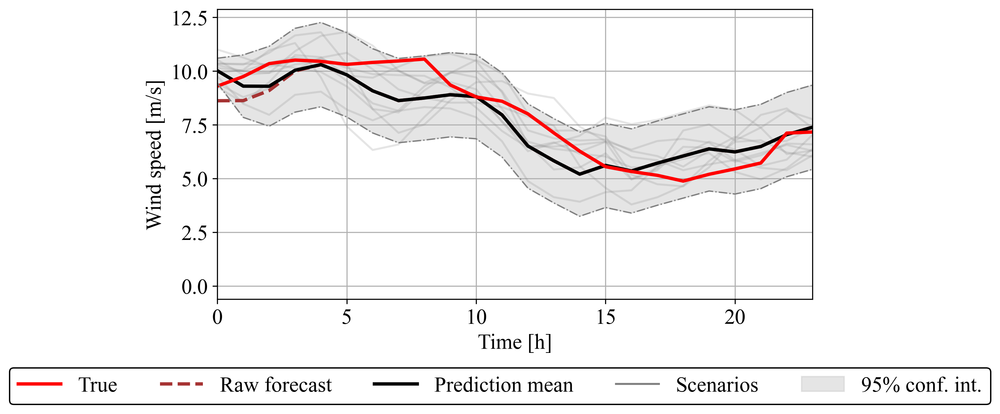

In [78]:
x = np.arange(24)
plt.figure(figsize=(8,4), dpi=300)

plt.plot([-1,-2],[0,1], color='red', linewidth=2.5)
plt.plot([-1,-2],[0,1], color=[0.65,0.2,0.2],linewidth=2.5,linestyle='--')
plt.plot([-1,-2],[0,1], color='black', linewidth=2.5)
plt.plot([-1,-2],[0,1], color='grey')
plt.fill_between([-1,-2],[0,1], alpha=0.5, color=[0.8,0.8,0.8])

plt.legend(['True', 'Raw forecast', 'Prediction mean', 'Scenarios', '95% conf. int.'], ncol=5, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')


plt.plot(ws_pred_samples[:,:10], color='grey', alpha=0.2)
plt.plot(ws_forecast_val, color=[0.65,0.2,0.2],linewidth=2.5,linestyle='--')
plt.plot(x,ws_pred_mean, color='black', linewidth=2.5)
plt.plot(x,ws_true_val, '-', color='red', linewidth=2.5)

plt.plot(x,ws_pred_mean - 1.9600 * np.diag(sigma_pred), color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')
plt.plot(x,ws_pred_mean + 1.9600 * np.diag(sigma_pred), color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')

plt.fill(np.concatenate([x, x[::-1]]),
    np.concatenate([ws_pred_mean - 1.9600 * np.diag(sigma_pred), (ws_pred_mean + 1.9600 * np.diag(sigma_pred))[::-1]]),
    alpha=0.5, color=[0.8,0.8,0.8])

plt.xlim([0,23])
plt.ylabel('Wind speed [m/s]')
plt.xlabel('Time [h]')
plt.grid(True)

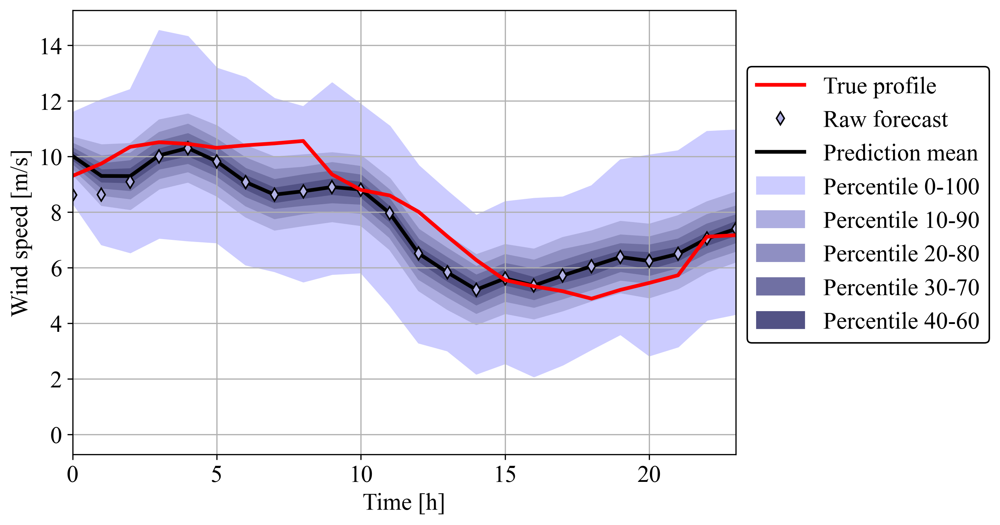

In [79]:
x = np.arange(24)
plt.figure(figsize=(8,5.5), dpi=300)
percentiles = [0,10,20,30,40]

plt.plot([-1,-2],[0,1], color='red', linewidth=2.5) #true
plt.plot([-1,-2],[0,1], 'd', color=[0.7,0.7,0.9],linewidth=2.5, markeredgecolor='k',markersize=6) #raw forecast
plt.plot([-1,-2],[0,1], color='black', linewidth=2.5) #predicted mean
leg = ['True profile', 'Raw forecast', 'Prediction mean']
for i in percentiles:
    plt.fill_between([-1,-2],[0,1], color=[0.8-1.2*i/100,0.8-1.2*i/100,1-1.2*i/100])#scenarios
    leg.append('Percentile '+str(i)+'-'+str(100-i))


plt.legend(leg, ncol=1, loc='upper center', bbox_to_anchor=(1.2,0.9,0,0), framealpha=1, edgecolor='k')


#plt.plot(ws_pred_samples, color='grey', alpha=0.2)
plt.plot(x,ws_pred_mean, color='black', linewidth=2.5)
plt.plot(ws_forecast_val, 'd', color=[0.7,0.7,0.9],linewidth=2.5, markeredgecolor='k',markersize=6)
plt.plot(x,ws_true_val, '-', color='red', linewidth=2.5)

#plt.plot(x,ws_pred_mean - 1.9600 * sigma1_pred, color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')
#plt.plot(x,ws_pred_mean + 1.9600 * sigma1_pred, color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')


for i in percentiles:
    plt.fill_between(x,np.percentile(ws_pred_samples,i,1),np.percentile(ws_pred_samples,100-i,1),
                     color=[0.8-1.2*i/100,0.8-1.2*i/100,1-1.2*i/100])

plt.xlim([0,23])
plt.ylabel('Wind speed [m/s]')
plt.xlabel('Time [h]')
plt.grid(True)